**Leading Causes of Death in the United States, 1999-2017**

Source: National Center for Health Statistics

Description: This dataset presents number of deaths and age-adjusted death rates for the 10 leading causes of death, as well as all causes of death combined, in the United States and by state for 1999-2017.

https://www.cdc.gov/nchs/data-visualization/mortality-leading-causes/index.htm

Rows and Columns: 10869 x 6


**Data Columns**


Year
113 Cause Name
Cause Name
State
Deaths
Age-adjusted Death Rate

# **Data Loading and Cleaning**

In [1]:
#pip install pandas geopandas matplotlib plotly folium

In [2]:
#pip install dash dash-bootstrap-components dash-table


In [3]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import geopandas as gpd
import folium
from folium.plugins import HeatMap
from geopy.geocoders import Nominatim

from shapely.geometry import Polygon
import matplotlib.colors as mcolors

import plotly.express as px

import dash
import dash_table
import dash_html_components as html
#import dash_core_components as dcc
from dash import dcc
import dash_bootstrap_components as dbc
from dash.dependencies import Input, Output

C:\Users\tinot\AppData\Local\Temp\ipykernel_13816\1348172574.py:18: UserWarning: 
The dash_table package is deprecated. Please replace
`import dash_table` with `from dash import dash_table`

Also, if you're using any of the table format helpers (e.g. Group), replace 
`from dash_table.Format import Group` with 
`from dash.dash_table.Format import Group`
  import dash_table
C:\Users\tinot\AppData\Local\Temp\ipykernel_13816\1348172574.py:19: UserWarning: 
The dash_html_components package is deprecated. Please replace
`import dash_html_components as html` with `from dash import html`
  import dash_html_components as html


In [4]:
# Load dataset
path = "./Leading_Causes_of_Death__United_States.csv"
df = pd.read_csv(path)

In [5]:
#Understanding the dataset
df.head(200)

,Year,113 Cause Name,Cause Name,State,Deaths,Age-adjusted Death Rate
0,2017,"Accidents (unintentional injuries) (V01-X59,Y8...",Unintentional injuries,Alabama,"2,703",53.8
1,2017,"Accidents (unintentional injuries) (V01-X59,Y8...",Unintentional injuries,Alaska,436,63.7
2,2017,"Accidents (unintentional injuries) (V01-X59,Y8...",Unintentional injuries,Arizona,"4,184",56.2
3,2017,"Accidents (unintentional injuries) (V01-X59,Y8...",Unintentional injuries,Arkansas,"1,625",51.8
4,2017,"Accidents (unintentional injuries) (V01-X59,Y8...",Unintentional injuries,California,"13,840",33.2
...,...,...,...,...,...,...
195,2017,Cerebrovascular diseases (I60-I69),Stroke,Rhode Island,425,29.4
196,2017,Cerebrovascular diseases (I60-I69),Stroke,South Carolina,"2,691",44.9
197,2017,Cerebrovascular diseases (I60-I69),Stroke,South Dakota,414,36.7
198,2017,Cerebrovascular diseases (I60-I69),Stroke,Tennessee,"3,519",45


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10867 entries, 0 to 10866
Data columns (total 6 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Year                     10867 non-null  int64 
 1   113 Cause Name           10867 non-null  object
 2   Cause Name               10867 non-null  object
 3   State                    10867 non-null  object
 4   Deaths                   10867 non-null  object
 5   Age-adjusted Death Rate  10867 non-null  object
dtypes: int64(1), object(5)
memory usage: 509.5+ KB


In [7]:
# Checking Missing Values
missing_values = df.isnull().sum()
print("Missing values in each column:")
print(missing_values)

Missing values in each column:
Year                       0
113 Cause Name             0
Cause Name                 0
State                      0
Deaths                     0
Age-adjusted Death Rate    0
dtype: int64


In [8]:
# Check for duplicate rows
duplicate_rows = df[df.duplicated()]
print("Duplicate rows found:")
print(duplicate_rows)

Duplicate rows found:
Empty DataFrame
Columns: [Year, 113 Cause Name, Cause Name, State, Deaths, Age-adjusted Death Rate]
Index: []


In [9]:
# Convert 'Deaths' and 'Age-adjusted Death Rate' to numeric, coercing errors to NaN (useful for invalid values)
df['Deaths'] = pd.to_numeric(df['Deaths'], errors='coerce')
df['Age-adjusted Death Rate'] = pd.to_numeric(df['Age-adjusted Death Rate'], errors='coerce')

# Check if there are any NaN values after conversion
print(df[['Deaths', 'Age-adjusted Death Rate']].isna().sum())

# Drop rows with NaN values in 'Deaths' and 'Age-adjusted Death Rate'
df_cleaned = df.dropna(subset=['Deaths', 'Age-adjusted Death Rate'])

# Check the data info again after cleaning
df_cleaned.info()


Deaths                     6991
Age-adjusted Death Rate      28
dtype: int64
<class 'pandas.core.frame.DataFrame'>
Index: 3876 entries, 1 to 10866
Data columns (total 6 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Year                     3876 non-null   int64  
 1   113 Cause Name           3876 non-null   object 
 2   Cause Name               3876 non-null   object 
 3   State                    3876 non-null   object 
 4   Deaths                   3876 non-null   float64
 5   Age-adjusted Death Rate  3876 non-null   float64
dtypes: float64(2), int64(1), object(3)
memory usage: 212.0+ KB


# **Map Visualisation**

**Choropleth Map - Death Rate by State**

Steps:
1. Load dataset
2. Merge the data with state geometries: Use geopandas to load geometries of U.S. states. Then merge this geographical data with your dataset.
3. Create the choropleth map: Use either matplotlib with geopandas or plotly to generate a choropleth map.
4. Visualize the data: Color the U.S. states based on the selected metric, such as death rates or number of deaths.

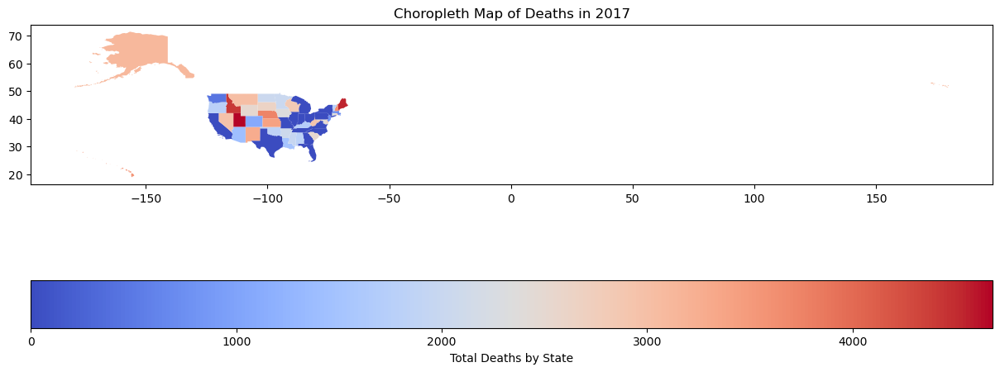

In [10]:
# Filter dataset for a specific year, if necessary
year_of_interest = 2017
df_year = df[df['Year'] == year_of_interest]

# Aggregate data by state (summing deaths or averaging age-adjusted death rates)
state_data = df_year.groupby('State').agg({
    'Deaths': 'sum',  # You can replace this with 'Age-adjusted Death Rate' if you prefer
}).reset_index()

# Load the shapefile for US states (GeoPandas provides shapefiles for US states)
# This assumes you have a shapefile called 'us_states_shapefile.shp' (or similar)
# You can download US state boundaries shapefiles from sources like US Census or Natural Earth
gdf = gpd.read_file("./tl_2024_us_state.shp")

# Merge the state data with the shapefile on the state names
merged = gdf.set_index('NAME').join(state_data.set_index('State'))

# Plot the choropleth map
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
merged.plot(column='Deaths',  # Change to 'Age-adjusted Death Rate' if desired
            ax=ax,
            legend=True,
            legend_kwds={'label': "Total Deaths by State",
                         'orientation': "horizontal"},
            cmap='coolwarm')  # Choose a color map (e.g., 'coolwarm', 'viridis', etc.)

plt.title(f"Choropleth Map of Deaths in {year_of_interest}")
plt.show()


**Density Map**

In [11]:
# Get the unique states from your dataset
unique_states = df['State'].unique()

# Instantiate the geocoder
geolocator = Nominatim(user_agent="death_rate_geocoder")

# Function to geocode the state (or region)
def geocode_state(state_name):
    try:
        location = geolocator.geocode(state_name)
        if location:
            return location.latitude, location.longitude
        else:
            print(f"Could not geocode {state_name}")  # Log failed geocoding
            return None, None  # Return None if geocoding fails
    except Exception as e:
        print(f"Error geocoding {state_name}: {e}")
        return None, None

# Create a dictionary to store latitude and longitude for each state
state_coords = {}

# Geocode each state and store the result in the dictionary
for state in unique_states:
    lat, lon = geocode_state(state)
    state_coords[state] = (lat, lon)

# Now map the latitude and longitude to the dataset based on the state names
df['Lat'], df['Lon'] = zip(*df['State'].map(lambda state: state_coords.get(state, (None, None))))

# Remove rows with missing latitude and longitude values
df_filtered = df.dropna(subset=['Lat', 'Lon'])

# Check if there are still missing values after filtering
print(f"Rows with missing geocoding: {df.shape[0] - df_filtered.shape[0]}")

# Prepare the data for the heatmap (use the latitude, longitude, and the death rate for density)
heat_data = [
    [row['Lat'], row['Lon'], row['Age-adjusted Death Rate']]
    for index, row in df_filtered.iterrows()
    if pd.notna(row['Lat']) and pd.notna(row['Lon']) and pd.notna(row['Age-adjusted Death Rate'])
]

# Double-check if any NaNs are present in heat_data
if any(pd.isna(i[0]) or pd.isna(i[1]) or pd.isna(i[2]) for i in heat_data):
    print("Warning: There are NaN values in the heat_data.")
else:
    # Create a base map centered on the United States
    m = folium.Map(location=[37.0902, -95.7129], zoom_start=4)  # Coordinates of the U.S. center

    # Add the heatmap layer
    HeatMap(heat_data).add_to(m)

    # Save the map to an HTML file and display it
    m.save("death_density_map.html")
    print("Map has been saved as 'death_density_map.html'")


Rows with missing geocoding: 0
Map has been saved as 'death_density_map.html'


In [12]:
df.head()

,Year,113 Cause Name,Cause Name,State,Deaths,Age-adjusted Death Rate,Lat,Lon
0,2017,"Accidents (unintentional injuries) (V01-X59,Y8...",Unintentional injuries,Alabama,NaN,53.8,33.258882,-86.829534
1,2017,"Accidents (unintentional injuries) (V01-X59,Y8...",Unintentional injuries,Alaska,436.0,63.7,64.445961,-149.680909
2,2017,"Accidents (unintentional injuries) (V01-X59,Y8...",Unintentional injuries,Arizona,NaN,56.2,34.395342,-111.763275
3,2017,"Accidents (unintentional injuries) (V01-X59,Y8...",Unintentional injuries,Arkansas,NaN,51.8,35.204888,-92.447911
4,2017,"Accidents (unintentional injuries) (V01-X59,Y8...",Unintentional injuries,California,NaN,33.2,36.701463,-118.755997


In [13]:
# Filter out rows where latitude, longitude, or death rate is missing
df_filtered = df.dropna(subset=['Lat', 'Lon', 'Age-adjusted Death Rate'])

# Prepare the data for the heatmap (use the latitude, longitude, and the death rate for density)
heat_data = [
    [row['Lat'], row['Lon'], row['Age-adjusted Death Rate']]
    for index, row in df_filtered.iterrows()
]

# Create a base map centered on the United States
m = folium.Map(location=[37.0902, -95.7129], zoom_start=4)  # Coordinates of the U.S. center

# Add the heatmap layer
HeatMap(heat_data).add_to(m)

# Save the map to an HTML file and display it
m.save("death_density_map.html")
print("Map has been saved as 'death_density_map.html'")

# Display the map directly (for Jupyter Notebook or Google Colab)
m


Map has been saved as 'death_density_map.html'


**Bubble Map**

In [14]:

# Filter the data to remove rows with missing values
df_filtered = df.dropna(subset=['Lat', 'Lon', 'Deaths', 'Age-adjusted Death Rate'])

# Create the map centered on the United States
m = folium.Map(location=[37.0902, -95.7129], zoom_start=4)

# Find the min and max deaths to scale the bubbles proportionally
min_deaths = df_filtered['Deaths'].min()
max_deaths = df_filtered['Deaths'].max()

# Loop through the filtered dataset and add a circle marker for each state
for index, row in df_filtered.iterrows():
    # For death count, use 'Deaths'
    magnitude = row['Deaths']  # Deaths column to determine bubble size

    # Scale the magnitude to control the bubble size (radius should vary based on 'Deaths')
    # Linear scaling of radius based on the min and max number of deaths
    radius = (magnitude - min_deaths) / (max_deaths - min_deaths) * 10  # Adjust the factor 30 for desired size range

    # Add the circle marker to the map
    folium.CircleMarker(
        location=[row['Lat'], row['Lon']],
        radius=radius,  # Radius scaled based on death count
        color='blue',  # Circle color
        fill=True,
        fill_color='blue',  # Fill color
        fill_opacity=0.6,  # Transparency of the fill
        popup=f"{row['State']}: {magnitude} deaths",  # Popup with state and death count
    ).add_to(m)

# Display the map (in Jupyter or Colab, this will display it directly)
m


# **Aggregation Visualization**

**scatter plot - Total Deaths vs Year**

Total Deaths versus Year, we will first need to aggregate the dataset to get the total number of deaths per year. Then, we can plot this data in a scatter plot format using Plotly.

In [15]:
# Aggregate the data by year and calculate the total deaths for each year
df_yearly = df.groupby('Year')['Deaths'].sum().reset_index()

# Create the scatter plot with dot size and color proportional to the number of deaths
fig = px.scatter(df_yearly,
                 x='Year',
                 y='Deaths',
                 size='Deaths',  # Set the size of the dots based on the number of deaths
                 color='Deaths',  # Set the color of the dots based on the number of deaths
                 color_continuous_scale='Viridis',  # Choose a color scale (optional)
                 title="Total Deaths vs Year",
                 labels={'Year': 'Year', 'Deaths': 'Total Deaths'})

# Show the plot
fig.show()


**Box Plot for Age-adjusted Death Rate by Cause**

This will show the spread (quartiles) and potential outliers of the age-adjusted death rate for each cause of death

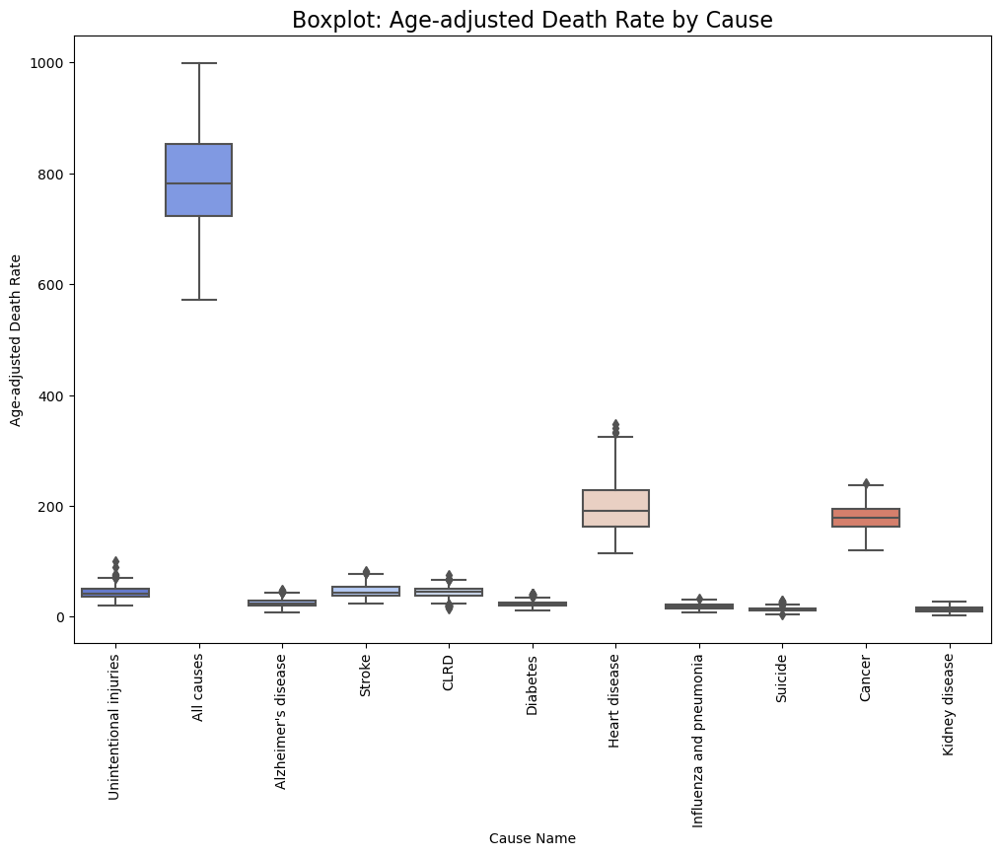

In [16]:
# Plot boxplot for Age-adjusted Death Rate by Cause
plt.figure(figsize=(12, 8))  # Increase the height to make the plot more stretched vertically
sns.boxplot(x='Cause Name', y='Age-adjusted Death Rate', data=df, palette='coolwarm')
plt.title('Boxplot: Age-adjusted Death Rate by Cause', fontsize=16)
plt.xlabel('Cause Name')
plt.ylabel('Age-adjusted Death Rate')
plt.xticks(rotation=90)  # Rotate cause names for better visibility

plt.show()


**violin plot**

 combines aspects of a boxplot and a density plot to show the distribution of deaths by state. The width of the plot indicates the density of the data points.

In [17]:
# Create an interactive violin plot for Deaths by State
fig = px.violin(df,
                x='State',
                y='Deaths',
                color='State',  # Color each state differently
                box=True,  # Add a box plot inside the violin plot
                hover_data=['State', 'Deaths'],  # Show State and Deaths on hover
                title='Violin Plot: Deaths by State',
                labels={'Deaths': 'Deaths', 'State': 'State'})

# Customize the layout for better readability
fig.update_layout(
    title='Violin Plot: Deaths by State',
    xaxis_title='State',
    yaxis_title='Deaths',
    xaxis_tickangle=-90,  # Rotate the x-axis labels for better readability
    showlegend=False  # Hide the legend as each violin plot is already colored by state
)

# Show the plot
fig.show()


# **Interactive Visualization**

**Tabular Visualization (Interactive Table)**

Tabular visualizations allow users to interactively explore the raw data. One popular library for this is plotly or dash. However, for simplicity, we will use dash here for a more robust experience.

In [18]:
table_app = dash.Dash(__name__, external_stylesheets=[dbc.themes.BOOTSTRAP])

# Create an interactive table
table_app.layout = html.Div([
    dbc.Row([dbc.Col(html.H1("Leading Causes of Death - Data Table"), width={'size': 6, 'offset': 3})]),
    dbc.Row([dbc.Col(dash_table.DataTable(
        id='death-data-table',
        columns=[
            {"name": col, "id": col} for col in df.columns
        ],
        data=df.to_dict('records'),
        style_table={'height': '400px', 'overflowY': 'auto'},
        filter_action="native",  # Enable filtering
        sort_action="native",    # Enable sorting
        page_size=10
    ), width=12)])
])

if __name__ == '__main__':
    table_app.run_server(debug=True)


**Interactive Choropleth Map**

In [19]:
# Drop rows with missing 'Deaths' values
df = df.dropna(subset=['Deaths'])

# Fill missing 'Deaths' values with the median value of the column
df['Deaths'] = df['Deaths'].fillna(df['Deaths'].median())


# Check for missing values again
print(df[['Lon', 'Lat', 'Deaths']].isnull().sum())


# Check for missing values again
print(df[['Lon', 'Lat', 'Deaths']].isnull().sum())


Lon       0
Lat       0
Deaths    0
dtype: int64
Lon       0
Lat       0
Deaths    0
dtype: int64


In [20]:
import plotly.express as px

# Create the scatter map (bubble map) using Plotly
fig = px.scatter_geo(df,
                     lat='Lat',
                     lon='Lon',
                     color='Age-adjusted Death Rate',  # Color by death rate
                     size='Deaths',  # Size of the bubble by Deaths
                     hover_name='State',  # Show the state name on hover
                     hover_data=['Age-adjusted Death Rate', 'Deaths'],  # Show additional data on hover
                     color_continuous_scale='Viridis',  # Color scale for the map
                     size_max=30,  # Maximum size for the bubbles
                     title="Death Rates and Counts by Location",
                     animation_frame='Year'  # Set 'Year' as the animation frame
                    )

# Update the map layout for better display
fig.update_geos(projection_type="albers usa", visible=True, showland=True)

# Show the map
fig.show()


**Box Plot**

Deaths vs Year vs Causes



In [21]:
# Ensure 'Year' and 'Cause Name' are categorical
df['Year'] = df['Year'].astype(str)
df['Cause Name'] = df['Cause Name'].astype(str)

# Initialize Dash app
bloxplotapp = dash.Dash(__name__)

# Layout of the app
bloxplotapp.layout = html.Div([
    html.H1("Interactive Boxplot: Age-adjusted Death Rate by Cause"),

    # Dropdown for selecting the year
    dcc.Dropdown(
        id='year-dropdown',
        options=[{'label': year, 'value': year} for year in df['Year'].unique()],
        value=df['Year'].min(),  # Default year to the first year
        multi=False,
        style={'width': '50%'}
    ),

    # Dropdown for selecting the cause of death
    dcc.Dropdown(
        id='cause-dropdown',
        options=[{'label': cause, 'value': cause} for cause in df['Cause Name'].unique()],
        value=None,  # Default to show all causes
        multi=True,
        style={'width': '50%'}
    ),

    # Graph to show the boxplot
    dcc.Graph(id='death-rate-boxplot')
])

# Callback to update the graph
@bloxplotapp.callback(
    Output('death-rate-boxplot', 'figure'),
    [Input('year-dropdown', 'value'),
     Input('cause-dropdown', 'value')]
)

def update_boxplot(selected_year, selected_causes):
    # Filter the dataset based on the selected year and causes
    filtered_df = df[df['Year'] == selected_year]

    if selected_causes:
        filtered_df = filtered_df[filtered_df['Cause Name'].isin(selected_causes)]

    # Create the boxplot
    fig = px.box(filtered_df,
                 x='Cause Name',
                 y='Age-adjusted Death Rate',
                 color='Cause Name',
                 hover_data=['Cause Name', 'Age-adjusted Death Rate'],
                 title=f"Boxplot: Age-adjusted Death Rate by Cause for {selected_year}",
                 labels={'Age-adjusted Death Rate': 'Age-adjusted Death Rate', 'Cause Name': 'Cause Name'})

    # Customize layout
    fig.update_layout(
        xaxis_title='Cause Name',
        yaxis_title='Age-adjusted Death Rate',
        title=f"Boxplot: Age-adjusted Death Rate by Cause for {selected_year}",
        xaxis_tickangle=-90,
        showlegend=False
    )

    return fig

# Run the app
if __name__ == '__main__':
    bloxplotapp.run_server(debug=True)


**Scatter Plot**

Deaths vs Year vs Causes



In [22]:
# Ensure 'Year', 'Cause Name', and 'State' are treated as strings (if necessary)
df['Year'] = df['Year'].astype(str)
df['Cause Name'] = df['Cause Name'].astype(str)
df['State'] = df['State'].astype(str)

# Aggregate the data to calculate total deaths for each year and Age-adjusted Death Rate
df_yearly = df.groupby('Year').agg({'Deaths': 'sum', 'Age-adjusted Death Rate': 'mean'}).reset_index()

# Initialize Dash app
scatterplotapp = dash.Dash(__name__)

# Layout of the app
scatterplotapp.layout = html.Div([
    html.H1("Interactive Scatter Plot: Total Deaths vs Year with Age-adjusted Death Rate"),

    # Dropdown for selecting the year (single or all years)
    dcc.Dropdown(
        id='year-dropdown',
        options=[{'label': year, 'value': year} for year in sorted(df['Year'].unique())] + [{'label': 'All Years', 'value': 'All Years'}],
        value='All Years',  # Default to 'All Years'
        multi=False,
        style={'width': '50%'}
    ),

    # Dropdown for selecting the disease (cause of death)
    dcc.Dropdown(
        id='cause-dropdown',
        options=[{'label': cause, 'value': cause} for cause in sorted(df['Cause Name'].unique())] + [{'label': 'All Causes', 'value': 'All Causes'}],
        value='All Causes',  # Default to 'All Causes'
        multi=False,
        style={'width': '50%'}
    ),

    # Dropdown for selecting the state (single or all states)
    dcc.Dropdown(
        id='state-dropdown',
        options=[{'label': state, 'value': state} for state in sorted(df['State'].unique())] + [{'label': 'All States', 'value': 'All States'}],
        value='All States',  # Default to 'All States'
        multi=False,
        style={'width': '50%'}
    ),

    # Graph to show the scatter plot
    dcc.Graph(id='death-scatter-plot')
])

# Callback to update the scatter plot
@scatterplotapp.callback(
    Output('death-scatter-plot', 'figure'),
    [Input('year-dropdown', 'value'),
     Input('cause-dropdown', 'value'),
     Input('state-dropdown', 'value')]
)
def update_scatter_plot(selected_year, selected_cause, selected_state):
    # Filter data based on selected year, cause, and state
    filtered_df = df

    if selected_year != 'All Years':
        filtered_df = filtered_df[filtered_df['Year'] == selected_year]

    if selected_cause != 'All Causes':
        filtered_df = filtered_df[filtered_df['Cause Name'] == selected_cause]

    if selected_state != 'All States':
        filtered_df = filtered_df[filtered_df['State'] == selected_state]

    # Aggregate the data for the scatter plot
    df_yearly = filtered_df.groupby('Year').agg({'Deaths': 'sum', 'Age-adjusted Death Rate': 'mean'}).reset_index()

    # Create the scatter plot
    fig = px.scatter(df_yearly,
                     x='Year',
                     y='Deaths',
                     size='Age-adjusted Death Rate',  # Size of the dot based on Age-adjusted Death Rate
                     color='Year',  # Color by Year (this will make the plot easier to interpret by showing how the color changes over time)
                     hover_data=['Deaths', 'Age-adjusted Death Rate'],  # Display Deaths and Age-adjusted Death Rate on hover
                     title=f"Total Deaths vs Year with Age-adjusted Death Rate for {selected_year} - {selected_cause} - {selected_state}",
                     labels={'Deaths': 'Total Deaths', 'Age-adjusted Death Rate': 'Age-adjusted Death Rate', 'Year': 'Year'})

    # Customize layout for better readability
    fig.update_layout(
        title=f"Total Deaths vs Year with Age-adjusted Death Rate for {selected_year} - {selected_cause} - {selected_state}",
        xaxis_title='Year',
        yaxis_title='Total Deaths',
        showlegend=False  # Hide the legend if it's not needed
    )

    return fig

# Run the app
if __name__ == '__main__':
    scatterplotapp.run_server(debug=True)


---------------------------------------------------------------------------
KeyError                                  Traceback (most recent call last)
File ~\anaconda3\Lib\site-packages\dash\dash.py:1307, in Dash.dispatch(self=<dash.dash.Dash object>)
   1306 try:
-> 1307     cb = self.callback_map[output]
        output = 'death-rate-boxplot.figure'
        self.callback_map = {'death-scatter-plot.figure': {'inputs': [{'id': 'year-dropdown', 'property': 'value'}, {'id': 'cause-dropdown', 'property': 'value'}, {'id': 'state-dropdown', 'property': 'value'}], 'state': [], 'outputs_indices': 0, 'inputs_state_indices': [0, 1, 2], 'long': None, 'output': <Output `death-scatter-plot.figure`>, 'raw_inputs': [<Input `year-dropdown.value`>, <Input `cause-dropdown.value`>, <Input `state-dropdown.value`>], 'manager': None, 'allow_dynamic_callbacks': None, 'no_output': False, 'callback': <function update_scatter_plot at 0x000001A04737B420>}}
        self = <dash.dash.Dash object at 0x000001A04303

## 